# **Cel biznesowy**
Ramka danych, którą wykorzystujemy w projekcie, pochodzi z publicznego zbioru danych zawierającego obrazy rentgenowskie klatki piersiowej pacjentów w trzech kategoriach: COVID-19, zapalenie płuc oraz obrazy prawidłowe. Każdy obraz przedstawia wnętrze klatki piersiowej i potencjalne zmiany chorobowe, które mogą być trudne do oceny przy dużej liczbie przypadków. Dane te są zorganizowane w folderach odpowiadających klasom, co pozwala nam na przypisanie etykiet w razie potrzeby, chociaż w klasteryzacji nie są one wykorzystywane w procesie trenowania.

Biznesowym celem tego projektu jest stworzenie systemu, który umożliwia automatyczne grupowanie obrazów rentgenowskich według ich podobieństwa, bez konieczności ręcznego oznaczania przez specjalistów. Takie podejście może znacznie przyspieszyć pracę radiologów oraz wspomóc mniej doświadczonych lekarzy w identyfikowaniu obrazów o podobnym charakterze do znanych przypadków. Pozwala to również na wcześniejsze wykrywanie potencjalnych ognisk chorób zakaźnych takich jak COVID-19, zwłaszcza w sytuacjach, gdy dostęp do specjalistycznej wiedzy jest ograniczony. W dłuższej perspektywie może to prowadzić do redukcji kosztów diagnostyki, skrócenia czasu oczekiwania na diagnozę oraz zwiększenia dostępności analiz obrazowych w mniej rozwiniętych regionach.

In [1]:
import kagglehub

path = kagglehub.dataset_download("riyadhalmosawi/covid19-pneumonia-normal-chest-x-ray-images")

100%|██████████| 277M/277M [00:06<00:00, 45.0MB/s]

Extracting files...


In [2]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

dataset_path = Path(path)

image_files = list(dataset_path.rglob("*.jpeg")) + list(dataset_path.rglob("*.jpg")) + list(dataset_path.rglob("*.png"))


# **Eksploracja danych**

Kategoria: NORMAL (1802 obrazów)


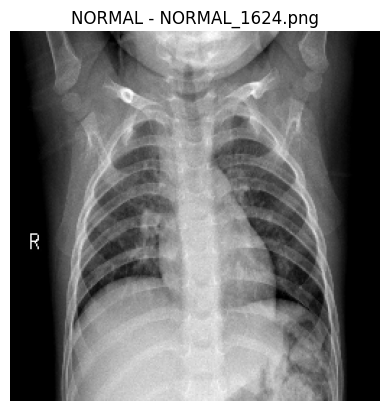

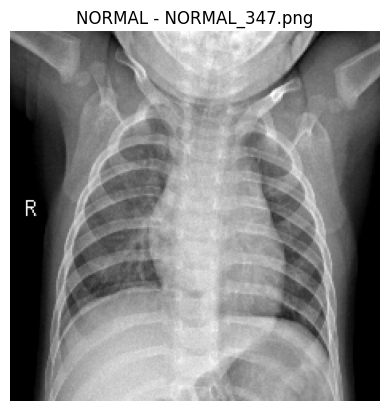

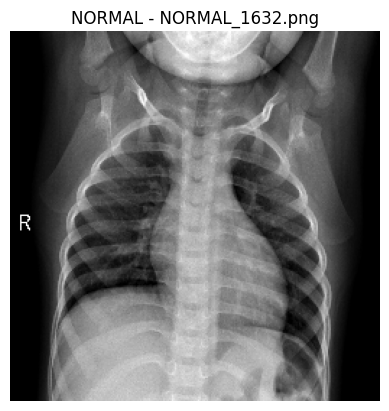

Kategoria: PNEUMONIA (1800 obrazów)


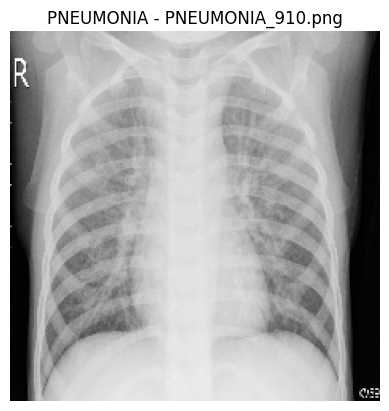

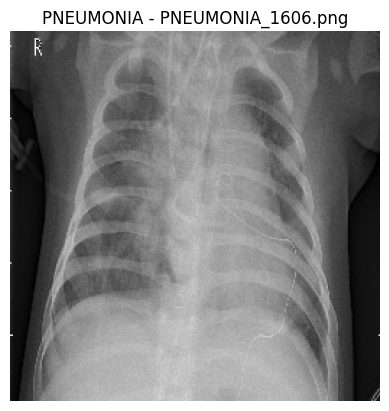

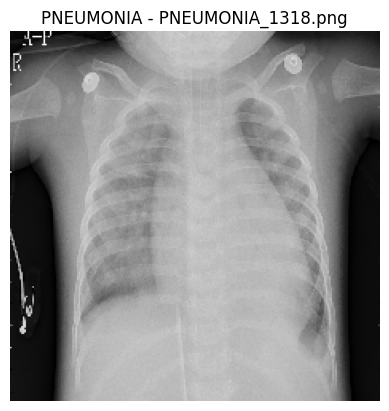

Kategoria: COVID (1626 obrazów)


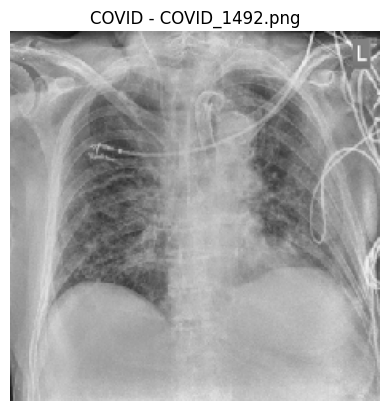

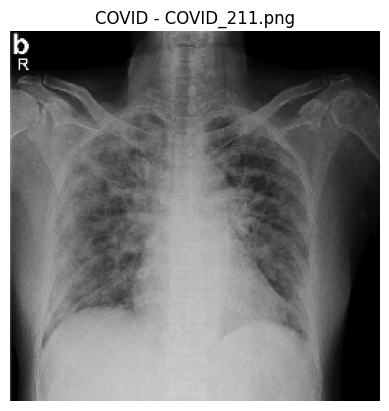

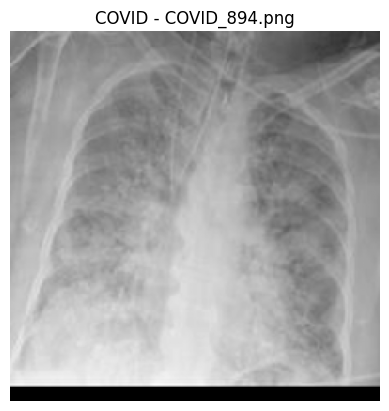

1. Liczba obrazów w każdej klasie:
 - NORMAL: 1802 obrazów
 - PNEUMONIA: 1800 obrazów
 - COVID: 1626 obrazów
2. Unikalne rozdzielczości obrazów:
 - 232 x 232
 - 256 x 256
3. Uszkodzone obrazy: 0
4. Obrazy zbyt małe (<64px): 0


In [3]:
# Inicjalizacja katalogu zdjęć
image_counts = {}
resolutions = set()
corrupted_files = []
too_small = []

# Przejście przez foldery klas (np. COVID, NORMAL, PNEUMONIA)
for class_dir in dataset_path.iterdir():
    if class_dir.is_dir():
        images = list(class_dir.glob("*.*"))
        image_counts[class_dir.name] = len(images)

        print(f"Kategoria: {class_dir.name} ({len(images)} obrazów)")
        for i, img_path in enumerate(images[:3]):
            try:
                with Image.open(img_path) as img:
                    # Wyświetlamy obrazy
                    if i < 3:
                        plt.imshow(img.convert("L"), cmap="gray")
                        plt.title(f"{class_dir.name} - {img_path.name}")
                        plt.axis("off")
                        plt.show()

                    # Rozdzielczość
                    resolutions.add(img.size)

                    # Czy obraz zbyt mały
                    if img.size[0] < 64 or img.size[1] < 64:
                        too_small.append(img_path)

            except Exception as e:
                corrupted_files.append(img_path)
                print(f"Błąd ładowania pliku: {img_path.name} - {e}")

# Podsumowanie
print("1. Liczba obrazów w każdej klasie:")
for label, count in image_counts.items():
    print(f" - {label}: {count} obrazów")

print("2. Unikalne rozdzielczości obrazów:")
for res in sorted(resolutions):
    print(f" - {res[0]} x {res[1]}")

print(f"3. Uszkodzone obrazy: {len(corrupted_files)}")
if corrupted_files:
    print("Np.:", corrupted_files[:3])

print(f"4. Obrazy zbyt małe (<64px): {len(too_small)}")
if too_small:
    print("Np.:", too_small[:3])


Zbiór danych składa się łącznie z 5228 obrazów rentgenowskich klatki piersiowej, podzielonych na trzy kategorie: COVID (1626 obrazów), NORMAL (1802 obrazów) oraz PNEUMONIA (1800 obrazów). Rozkład klas jest bardzo zrównoważony, więc nie musimy balansować danych.

Wszystkie obrazy posiadają jedną z dwóch unikalnych rozdzielczości: 232x232 lub 256x256 pikseli, co wskazuje na jednolitą jakość danych i ułatwia ich przetwarzanie. Nie wykryto żadnych uszkodzonych ani zbyt małych obrazów.

# **Czyszczenie danych**

Zauważyliśmy jednak, że niektóre z naszych obrazów zawierają zanieczyszczenia, takie jak strzałki czy symbole (przykład poniżej). Postanowiliśmy je usunąć, aby nie wprowadzały sztucznych skupisk i nie zakłócały działania modelu klasteryzacji, który mógłby je błędnie potraktować jako istotne cechy obrazu. Dzięki temu analiza będzie bardziej wiarygodna i oparta na rzeczywistej strukturze danych.









In [4]:
# Kod, który wyświetla ścieżke do konkretnego pliku - ścieżka ta się często zmienia (w Kaggle) więc czasami należy podmienić ścieżke

dataset_path = Path(path)
results = list(dataset_path.rglob("COVID_2.png"))

if results:
    print("Znaleziono plik:", results[0].resolve())
else:
    print("Plik COVID_2.png nie został znaleziony.")
img_path = results[0].resolve()

Znaleziono plik: /root/.cache/kagglehub/datasets/riyadhalmosawi/covid19-pneumonia-normal-chest-x-ray-images/versions/1/COVID/COVID_2.png


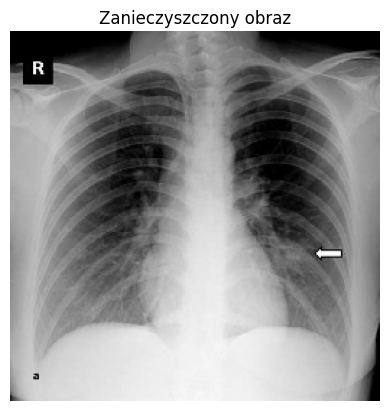

In [5]:
#!pip install opencv-python # wykonać jak nie ma pakietu

import cv2

img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

plt.imshow(img, cmap='gray')
plt.title("Zanieczyszczony obraz")
plt.axis('off')

plt.show()

W poniższym kodzie automatycznie usuwamy jasne zakłócenia (np. strzałki) z obrazów medycznych lub technicznych. Najpierw wykrywamy bardzo jasne obszary, tworzymy wokół nich powiększoną maskę, a następnie „zamazujemy” je techniką inpaintingu – algorytm inteligentnie uzupełnia brakujące fragmenty na podstawie otoczenia. Dzięki temu uzyskujemy czystsze obrazy do dalszej analizy.

In [6]:
import os
import numpy as np
# parametry maskowania
threshold_value = 220
kernel_size = (5, 5)
dilate_iterations = 2
inpaint_radius = 3

# Zmienna image_files jest listą ścieżek do wszystkich obrazów utworzoną wcześniej w notebooku

# lokalny folder na oczyszczone obrazy
output_dir = Path("./output_cleaned")
output_dir.mkdir(exist_ok=True)

for image_path in image_files:
    print(f"Przetwarzanie: {image_path.name}...", end="")
    img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        print(f" NIE UDAŁO SIĘ wczytać: {image_path}")
        continue

    _, mask = cv2.threshold(img, threshold_value, 255, cv2.THRESH_BINARY)
    kernel = np.ones(kernel_size, np.uint8)
    mask_dilated = cv2.dilate(mask, kernel, iterations=dilate_iterations)
    img_cleaned = cv2.inpaint(img, mask_dilated, inpaint_radius, cv2.INPAINT_TELEA)

    # Nowa ścieżka zapisu — w lokalnym folderze
    cleaned_path = output_dir / (image_path.stem + "_cleaned.png")

    success = cv2.imwrite(str(cleaned_path), img_cleaned)

    if success:
        print(" Zapisano pomyślnie.")
    else:
        print(f" BŁĄD ZAPISU: Nie udało się zapisać pliku {cleaned_path.name}")


Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
Przetwarzanie: NORMAL_388.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_107.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_720.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1214.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1421.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_480.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1293.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_364.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1021.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1380.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_551.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_382.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_702.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1383.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_1272.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_80.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_200.png... Zapisano pomyślnie.
Przetwarzanie: NORMAL_258.pn

In [7]:
cleaned_path = Path("output_cleaned/COVID_2_cleaned.png")
print("Pełna ścieżka:", cleaned_path.resolve())

Pełna ścieżka: /content/output_cleaned/COVID_2_cleaned.png


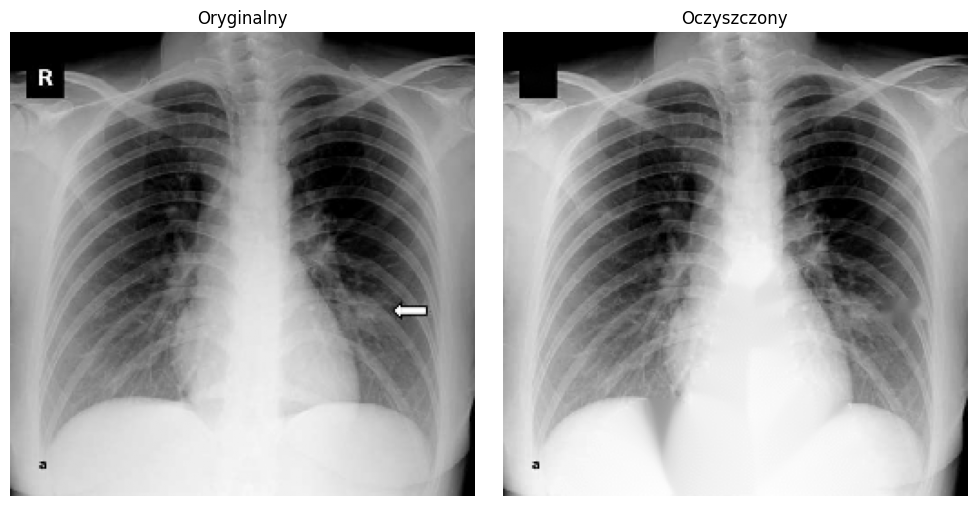

In [8]:
import cv2

# Ścieżki do obu plików
cleaned_path = cleaned_path
original_path = img_path
img_original = cv2.imread(original_path, cv2.IMREAD_GRAYSCALE)
img_cleaned = cv2.imread(cleaned_path, cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(img_original, cmap='gray')
plt.title("Oryginalny")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_cleaned, cmap='gray')
plt.title("Oczyszczony")
plt.axis('off')

plt.tight_layout()
plt.show()

W naszym zbiorze zjęć występują dwa rodzaje rozdzielczości 232x232 i 256x256. Postanowiliśmy sprowadzić wszystkie zdjęcia do jednej z nich. Ujednolicenie rozdzielczości jest kluczowe, ponieważ wiele algorytmów analizy obrazu – w tym metody klasteryzacji - wymaga, aby dane wejściowe miały ten sam wymiar. Skalowanie eliminuje różnice wynikające z różnych rozmiarów oryginalnych obrazów, co pozwala modelom skupić się na rzeczywistej zawartości obrazu, a nie na technicznych różnicach w jego strukturze.

In [9]:
output_dir = Path("images_processed")
output_dir.mkdir(exist_ok=True)

img_files_final = []

# docelowy rozmiar
target_size = (256, 256)

cleaned_images_dir = Path("output_cleaned")
cleaned_image_files = list(cleaned_images_dir.glob("*.png"))

print(f"Przetwarzanie obrazów z '{cleaned_images_dir}' i skalowanie do '{output_dir}'...")

for cleaned_image_path in cleaned_image_files:

    print(f"Przetwarzanie i skalowanie: {cleaned_image_path.name}...", end="")
    img = cv2.imread(str(cleaned_image_path), cv2.IMREAD_GRAYSCALE)

    if img is None:
        print(f" BŁĄD Wczytywania: Nie udało się wczytać pliku {cleaned_image_path.name}")
        continue # przechodzi do następnego pliku, jeśli wczytywanie się nie powiodło

    # zmiana rozmiaru
    resized_img = cv2.resize(img, target_size, interpolation=cv2.INTER_AREA)

    # ścieżka do zapisu w katalogu images_processed
    new_filename = cleaned_image_path.name
    resized_path = output_dir / new_filename
    success = cv2.imwrite(str(resized_path), resized_img)

    # komunikaty
    if success:
        print("Zapisano.")
        img_files_final.append(resized_path)
    else:
        print(f"BŁĄD ZAPISU: Nie udało się zapisać pliku {resized_path.name}") # błąd
    # ---------------------------

print(f"\nZakończono przetwarzanie i skalowanie obrazów. Łącznie zapisano {len(img_files_final)} plików w katalogu: {output_dir.resolve()}")

Strumieniowane dane wyjściowe obcięte do 5000 ostatnich wierszy.
Przetwarzanie i skalowanie: NORMAL_1398_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_1269_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_189_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONIA_855_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_160_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: COVID_1337_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_48_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_786_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: NORMAL_1419_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONIA_425_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONIA_780_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONIA_570_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONIA_839_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: COVID_1050_cleaned.png...Zapisano.
Przetwarzanie i skalowanie: PNEUMONI

Teraz powtórzmy eksploracje danych na nowym oczyszczonym i przeskalowanym zbiorze zdjęć.

Folder: images_processed (5228 obrazów)


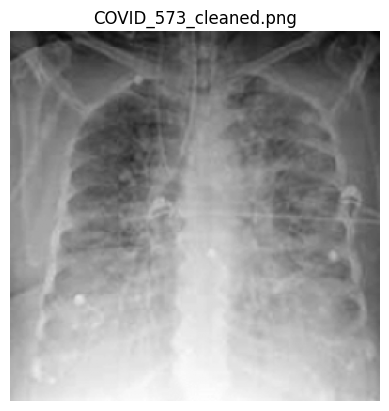

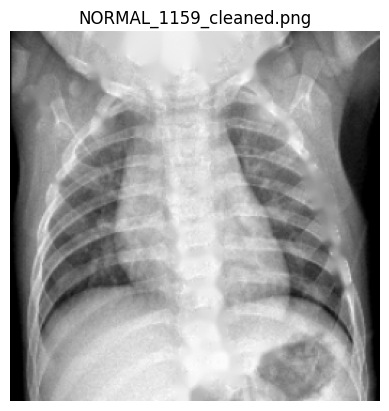

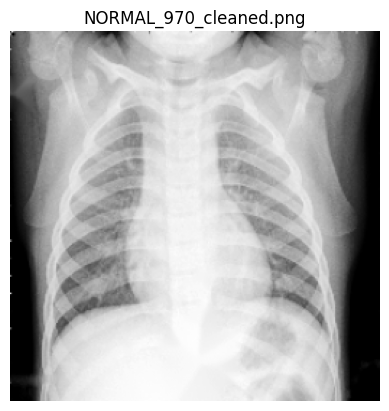

1. Liczba obrazów:
 - processed: 5228 obrazów
2. Unikalne rozdzielczości obrazów:
 - 256 x 256
3. Uszkodzone obrazy: 0
4. Obrazy zbyt małe (<64px): 0


In [10]:
processed_path = Path("images_processed")
image_counts = {}
resolutions = set()
corrupted_files = []
too_small = []

images = list(processed_path.glob("*.*"))
image_counts["processed"] = len(images)

print(f"Folder: images_processed ({len(images)} obrazów)")

# przegląd plików
for i, img_path in enumerate(images):
    try:
        with Image.open(img_path) as img:
            if i < 3:
                plt.imshow(img.convert("L"), cmap="gray")
                plt.title(f"{img_path.name}")
                plt.axis("off")
                plt.show()

            # zbieranie rozdzielczości
            resolutions.add(img.size)

            # sprawdzenie rozmiaru
            if img.size[0] < 64 or img.size[1] < 64:
                too_small.append(img_path)

    except Exception as e:
        corrupted_files.append(img_path)
        print(f"Błąd ładowania pliku: {img_path.name} - {e}")

# podsumowanie
print("1. Liczba obrazów:")
print(f" - processed: {image_counts['processed']} obrazów")

print("2. Unikalne rozdzielczości obrazów:")
for res in sorted(resolutions):
    print(f" - {res[0]} x {res[1]}")

print(f"3. Uszkodzone obrazy: {len(corrupted_files)}")
if corrupted_files:
    print("Np.:", corrupted_files[:3])

print(f"4. Obrazy zbyt małe (<64px): {len(too_small)}")
if too_small:
    print("Np.:", too_small[:3])


# **Inżynieria cech**

Nie będziemy klasteryzować surowych zdjęć (pikseli), bo mają one zbyt dużo danych (np. 65 000 wymiarów) i nie oddają sensu obrazu – komputer widzi tylko liczby, bez kontekstu kształtów czy struktur. Zamiast tego stworzymy nowe sztuczne cechy.

W poniższym kodzie uczymy sztuczną sieć neuronową (tzw. autoenkoder), żeby „zrozumiała”, co znajduje się na zdjęciach RTG płuc. Sieć uczy się kompresować każdy obraz do zestawu liczb (czyli tzw. cech), które najlepiej opisują jego zawartość – np. kształt płuc, kontrasty czy zmiany chorobowe.

Najpierw pokazujemy sieci dużo zdjęć i prosimy, żeby spróbowała odtworzyć je na nowo na podstawie tego, co „zapamiętała”. Dzięki temu uczy się wyłapywać tylko najważniejsze informacje, a pomija nieistotne szczegóły.

Na koniec z każdego zdjęcia wyciągamy krótki opis liczbowy – coś w rodzaju odcisku palca obrazu – i zapisujemy go do pliku. Te opisy (wektory cech) będą potem użyte do klasteryzacji.

In [11]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

IMG_SIZE = 256
LATENT_DIM = 128
BATCH_SIZE = 16
EPOCHS = 5
LEARNING_RATE = 1e-3

class XrayDataset(Dataset):
    def __init__(self, image_dir):
        self.image_paths = list(Path(image_dir).glob("*.png"))
        self.transform = transforms.Compose([
            transforms.Grayscale(num_output_channels=1),
            transforms.Resize((IMG_SIZE, IMG_SIZE)),
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx])
        img = self.transform(img)
        return img, str(self.image_paths[idx].name)

# autoenkoder
class Autoencoder(nn.Module):
    def __init__(self, latent_dim):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, 3, stride=2, padding=1),  # (B, 16, 128, 128)
            nn.ReLU(),
            nn.Conv2d(16, 32, 3, stride=2, padding=1), # (B, 32, 64, 64)
            nn.ReLU(),
            nn.Conv2d(32, 64, 3, stride=2, padding=1), # (B, 64, 32, 32)
            nn.ReLU(),
            nn.Flatten(),                              # (B, 64*32*32)
            nn.Linear(64 * 32 * 32, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 64 * 32 * 32),
            nn.Unflatten(1, (64, 32, 32)),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 16, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 1, 3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()  # dane są w [0,1]
        )

    def forward(self, x):
        latent = self.encoder(x)
        reconstructed = self.decoder(latent)
        return reconstructed, latent

dataset = XrayDataset("images_processed")
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = Autoencoder(LATENT_DIM).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=LEARNING_RATE)
loss_fn = nn.MSELoss()

model.train()
for epoch in range(EPOCHS):
    epoch_loss = 0
    for imgs, _ in loader:
        imgs = imgs.to(device)
        reconstructed, _ = model(imgs)
        loss = loss_fn(reconstructed, imgs)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
    print(f"Epoch {epoch+1}/{EPOCHS} - Loss: {epoch_loss/len(loader):.4f}")


model.eval()
all_features = []
all_names = []

with torch.no_grad():
    for imgs, names in DataLoader(dataset, batch_size=BATCH_SIZE):
        imgs = imgs.to(device)
        _, latents = model(imgs)
        all_features.append(latents.cpu().numpy())
        all_names.extend(names)

features_array = np.vstack(all_features)
np.save("features_autoencoder.npy", features_array)
np.save("filenames.npy", all_names)
print("Zapisano cechy do 'features_autoencoder.npy'")


Epoch 1/5 - Loss: 0.0126
Epoch 2/5 - Loss: 0.0052
Epoch 3/5 - Loss: 0.0042
Epoch 4/5 - Loss: 0.0036
Epoch 5/5 - Loss: 0.0033
Zapisano cechy do 'features_autoencoder.npy'


U nas autoenkoder zredukował też wymiar z 65 536 do 128, zachowując najważniejsze cechy obrazu.

In [12]:
# przykład

features = np.load("features_autoencoder.npy")
filenames = np.load("filenames.npy")

# 5 pierwszych wektorów cech
for i in range(5):
    print(f"{filenames[i]} → cechy: {features[i]}")


COVID_573_cleaned.png → cechy: [ 1.5304223   2.5997543  -0.14030316 -0.6891161  -1.0768456   0.40062886
 -1.1105777   0.07662359 -1.3191875   0.9736531  -1.133359   -0.6051148
 -0.54928637 -0.5012894  -1.4851382   0.8715651  -1.7735054   1.4600683
  0.6011615  -0.8063807   1.8642137   0.03526105  3.3987453  -1.1963176
  1.0330235   0.3198817   1.7226753  -2.1628869   0.582611    1.0733957
 -4.175167    0.539081   -0.57806855  0.23939782 -1.1468263  -1.0592935
  1.5738968  -1.0212011   0.65870184 -2.2752287   5.1947265   0.7382772
  1.7327393  -0.17635351 -2.318361    0.79189754 -0.58727777 -3.6138282
 -0.61771315  1.9556719  -0.25765228  3.3652601   1.7419701   4.0059566
  5.8420415   0.25551477 -0.99180275 -0.36038414  2.0475457   0.45258945
 -1.8308005  -0.40276927 -0.25220254  1.3534518  -0.7761836  -0.15377542
 -1.6377673   0.62584865  3.5755424   0.75193155  1.6413808   0.47735754
 -1.6909226  -0.7744106   1.8242611  -3.3837926   1.149012    0.98489285
 -0.73286206  0.50332433  1.

# **Podział na zbiory**

In [13]:
import random
import shutil
from collections import defaultdict

# użyjemy podział ze stratyfikacją
source_dir = Path("images_processed")
output_base = Path("split_data")
output_base.mkdir(exist_ok=True)

(train_p, val_p, test_p) = (0.49, 0.21, 0.30)
random.seed(42)  # aby zawsze losowało to samo

class_files = defaultdict(list)
for f in source_dir.glob("*.png"):
    name = f.name.upper()
    if "COVID" in name:
        class_files["COVID"].append(f)
    elif "NORMAL" in name:
        class_files["NORMAL"].append(f)
    elif "PNEUMONIA" in name:
        class_files["PNEUMONIA"].append(f)
    else:
        print(f"Pominięto plik: {f.name} (brak klasy w nazwie)")

# podziały
splits = {'train': defaultdict(list), 'val': defaultdict(list), 'test': defaultdict(list)}

for class_name, files in class_files.items():
    random.shuffle(files)
    n = len(files)
    n_train = int(train_p * n)
    n_val = int(val_p * n)

    splits['train'][class_name] = files[:n_train]
    splits['val'][class_name] = files[n_train:n_train + n_val]
    splits['test'][class_name] = files[n_train + n_val:]


for split, class_dict in splits.items():
    for class_name, files in class_dict.items():
        split_class_dir = output_base / split / class_name
        split_class_dir.mkdir(parents=True, exist_ok=True)
        for f in files:
            shutil.copy(f, split_class_dir / f.name)

# podsumowanie
total = 0
for split in ['train', 'val', 'test']:
    count = sum(len(splits[split][cls]) for cls in splits[split])
    total += count
    print(f"  {split}: {count} plików")
    for cls in ['COVID', 'NORMAL', 'PNEUMONIA']:
        print(f"    - {cls}: {len(splits[split][cls])} plików")
print(f"Łącznie: {total} plików")


  train: 2560 plików
    - COVID: 796 plików
    - NORMAL: 882 plików
    - PNEUMONIA: 882 plików
  val: 1097 plików
    - COVID: 341 plików
    - NORMAL: 378 plików
    - PNEUMONIA: 378 plików
  test: 1571 plików
    - COVID: 489 plików
    - NORMAL: 542 plików
    - PNEUMONIA: 540 plików
Łącznie: 5228 plików


In [14]:
# import random
# import shutil

# random.seed(123)  # żeby zawsze losowało to samo

# source_dir = Path("images_processed")
# output_base = Path("split_data")
# output_base.mkdir(exist_ok=True)
# (train_p, val_p, test_p) = (0.49, 0.21, 0.30)

# all_files = list(source_dir.glob("*.png"))
# random.shuffle(all_files)

# # podział
# n = len(all_files)
# train_files = all_files[:int(train_p * n)]
# val_files = all_files[int(train_p * n):int((train_p + val_p) * n)]
# test_files = all_files[int((train_p + val_p) * n):]

# splits = {'train': train_files, 'val': val_files, 'test': test_files}

# for split, files in splits.items():
#     split_dir = output_base / split
#     split_dir.mkdir(parents=True, exist_ok=True)
#     for f in files:
#         shutil.copy(f, split_dir / f.name)

# print(f"Podzielono {n} plików: train={len(train_files)}, val={len(val_files)}, test={len(test_files)}")


# **Pre-processing**

W ramach pre-processingu i redukcji wymiarowości najpierw przeskalowaliśmy dane, aby wszystkie cechy były porównywalne. Potem uprościliśmy ich opis (redukcja wymiarów z wykorzystaniem PCA), zachowując tylko to, co najważniejsze.

In [15]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

# lista nazw plików treningowych
train_files = set([f.name for f in Path("split_data/train").rglob("*.png")])

features = np.load("features_autoencoder.npy")
filenames = np.load("filenames.npy")  # np.array z nazwami plików

# indeksy tylko dla zbioru treningowego
train_indices = [i for i, name in enumerate(filenames) if name in train_files]

features_train = features[train_indices]
filenames_train = filenames[train_indices]

# normalizacja
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_train)

# redukcja wymiarów (PCA)
pca = PCA(n_components=50)
features_pca = pca.fit_transform(features_scaled)


# **Klastrowanie**

Następnie podzieliliśmy obrazy na 3 grupy (klastry) według K-means. Na końcu stworzyliśmy dwuwymiarowy wykres, na którym każdy punkt to jeden obraz RTG, a kolor pokazuje, do której grupy został przypisany - dzięki temu możemy łatwo zobaczyć, które obrazy są do siebie podobne.

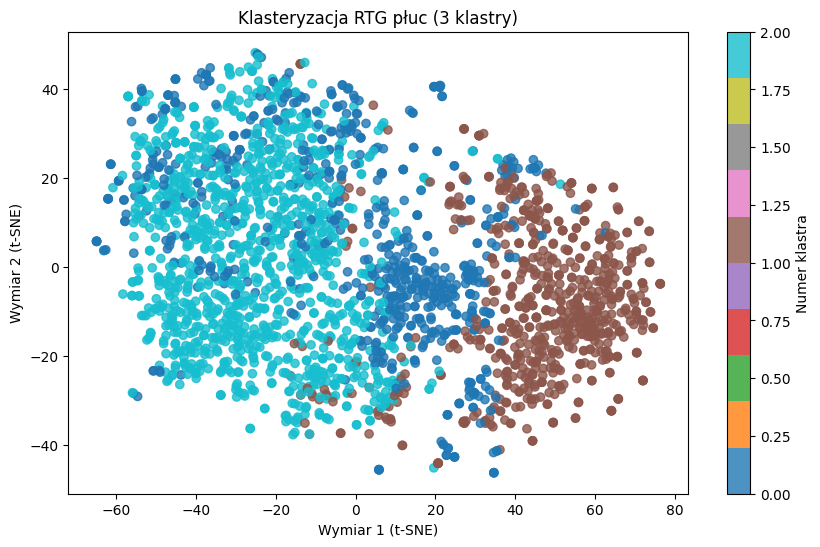

In [16]:
# klasteryzacja do 3 grup z użyciem K-means
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(features_pca)

# t-SNE
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features_pca)

# wykres
plt.figure(figsize=(10, 6))
scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap="tab10", alpha=0.8)
plt.title("Klasteryzacja RTG płuc (3 klastry)")
plt.xlabel("Wymiar 1 (t-SNE)")
plt.ylabel("Wymiar 2 (t-SNE)")
plt.colorbar(scatter, label="Numer klastra")
plt.show()


Oto przykład obrazów zakwalifikowanych do 1 klastra (wyniki są tylko poglądowe, nie wzorujemy się na "podpisach" ale warto rzucić okiem czy klastrowanie poszło pomyślnie)

Przykładowe obrazy z klastra 1:


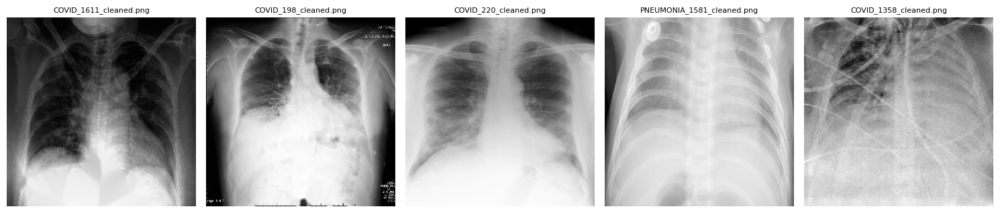

In [17]:
# Pobieramy etykiety klastrów z KMeans
labels = kmeans.labels_

filenames_full_processed = np.load("filenames.npy")

train_files_set = set([f.name for f in Path("split_data/train").rglob("*.png")])
train_indices = [i for i, name in enumerate(filenames_full_processed) if name in train_files_set]
filenames_train = filenames_full_processed[train_indices]
processed_images_dir = Path("images_processed")
cluster_id = 1
num_examples_to_show = 5

if cluster_id < 0 or cluster_id >= kmeans.n_clusters:
    print(f"Błąd: numer klastra {cluster_id} poza zakresem.")
else:
    print(f"Przykładowe obrazy z klastra {cluster_id}:")

    is_in_cluster = (labels == cluster_id)
    cluster_filenames = filenames_train[is_in_cluster]

    if len(cluster_filenames) == 0:
        print(f" - Brak plików w klastrze {cluster_id}.")
    else:
        examples_to_show = cluster_filenames[:num_examples_to_show]
        plt.figure(figsize=(3 * num_examples_to_show, 4))

        for i, filename in enumerate(examples_to_show):
            image_path = processed_images_dir / filename
            img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

            if img is None:
                print(f"Błąd: Nie udało się wczytać pliku {image_path}")
                continue

            plt.subplot(1, num_examples_to_show, i + 1)
            plt.imshow(img, cmap='gray')
            plt.title(filename, fontsize=8)
            plt.axis('off')

        plt.tight_layout()
        plt.show()


Zastosowanie algorytmu K-Means średnio pozwoliło na uzyskanie wyraźnych, odseparowanych grup – klastry są rozproszone i nakładają się na siebie. Może to oznaczać, że dane mają bardziej złożoną strukturę, niż zakłada ten algorytm.

Kolejne kroki:
W następnej kolejności wypróbujemy algorytm DBSCAN.

In [18]:
# Instalacja ipywidgets, jeśli nie są zainstalowane (w Colab zazwyczaj są)
# !pip install ipywidgets
# !jupyter nbextension enable --py widgetsnbextension

from sklearn.cluster import DBSCAN
from ipywidgets import interact, FloatSlider, IntSlider, VBox, HBox, Output
from IPython.display import display, clear_output # Dodajemy clear_output

dbscan_labels = None
n_clusters_dbscan = 0
n_noise_points = 0

def run_dbscan_and_plot(eps_value, min_samples_value):
    global dbscan_labels, n_clusters_dbscan, n_noise_points
    clear_output(wait=True)
    if 'features_pca' not in globals() or features_pca is None:
        print("Błąd")
        return
    if 'features_2d' not in globals() or features_2d is None:
        print("Błąd")
        return

    dbscan = DBSCAN(eps=eps_value, min_samples=min_samples_value)
    dbscan_labels = dbscan.fit_predict(features_pca)

    unique_labels = set(dbscan_labels)
    n_clusters_dbscan = len(unique_labels) - (1 if -1 in unique_labels else 0)
    n_noise_points = list(dbscan_labels).count(-1)

    print(f"Wyniki DBSCAN: Znaleziono {n_clusters_dbscan} klastrów i {n_noise_points} punktów szumu (-1).")
    if n_clusters_dbscan == 0 and n_noise_points < len(dbscan_labels):
         print("Uwaga: Wszystkie punkty to szum. Rozważ zwiększenie eps lub zmniejszenie min_samples.")
    elif n_clusters_dbscan == 1 and n_noise_points == 0:
         print("Uwaga: Znaleziono tylko 1 klaster (wszystkie punkty należą do jednej gęstej grupy bez szumu).")
    elif n_clusters_dbscan > 10:
         print(f"Uwaga: Znaleziono {n_clusters_dbscan} klastrów. Może być ich zbyt wiele. Rozważ zmniejszenie eps lub zwiększenie min_samples.")
    elif n_clusters_dbscan > 0 and n_noise_points == len(dbscan_labels):
         print("Uwaga: Znaleziono klastry, ale wszystkie punkty to szum. Sprawdź parametry.")


    plt.figure(figsize=(12, 8))

    core_samples_mask = (dbscan_labels != -1)
    noise_mask = (dbscan_labels == -1)

    scatter = None
    if n_clusters_dbscan > 0:
        cmap_name = 'tab20' if n_clusters_dbscan <= 20 else 'viridis' # inna mapa, jeśli więcej niż 20 klastrów
        try:
            cmap_clusters = plt.cm.get_cmap(cmap_name, n_clusters_dbscan)
        except ValueError:
             print(f"Warning: Nie można stworzyć mapy kolorów dla {n_clusters_dbscan} klastrów z mapą '{cmap_name}'. Używamy domyślnej.")
             cmap_clusters = plt.cm.get_cmap('viridis', n_clusters_dbscan)


        scatter = plt.scatter(features_2d[core_samples_mask, 0], features_2d[core_samples_mask, 1],
                                  c=dbscan_labels[core_samples_mask],
                                  cmap=cmap_clusters,
                                  edgecolors='k',
                                  s=50,
                                  alpha=0.8,
                                  label='Klaster')

    if np.sum(noise_mask) > 0:
        plt.scatter(features_2d[noise_mask, 0], features_2d[noise_mask, 1],
                c='gray',
                edgecolors='k',
                s=20,
                alpha=0.5,
                label='Szum (-1)')

    plt.title(f"Klasteryzacja RTG płuc - DBSCAN ({n_clusters_dbscan} klastrów, {n_noise_points} punktów szumu)")
    plt.xlabel("Wymiar 1 (t-SNE)")
    plt.ylabel("Wymiar 2 (t-SNE)")
    handles = []
    labels_plot = []

    # Dodajemy legendę
    if scatter is not None:
         try:
             handles_clusters, labels_clusters_plot = scatter.legend_elements(prop="colors", num=n_clusters_dbscan)
             handles.extend(handles_clusters)
             cluster_labels_in_data = sorted(set(dbscan_labels[core_samples_mask]))
             labels_plot.extend([f"Klaster {i}" for i in cluster_labels_in_data])
         except Exception as e:
             print(f"Warning: Problem z tworzeniem legendy klastrów: {e}")
             # Fallback na prostą legendę klastrów
             handles.append(plt.Line2D([0], [0], marker='o', color='w', label='Klastery', markerfacecolor='blue', markersize=10, markeredgecolor='k'))
             labels_plot.append('Klastery')

    if np.sum(noise_mask) > 0:
        noise_handle = plt.Line2D([0], [0], marker='o', color='w', label='Szum (-1)',
                                  markerfacecolor='gray', markersize=10, markeredgecolor='k')
        handles.append(noise_handle)
        labels_plot.append('Szum (-1)')

    if handles:
        plt.legend(handles=handles, labels=labels_plot, title="Klastery i Szum",
                   bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.grid(True)
    plt.tight_layout()
    plt.show()


# tworzymy suwaki aby łatwiej było testować dbscan dla róznich wartości
eps_slider = FloatSlider(min=0.1, max=50.0, step=0.1, value=10.0, description='Eps:')
min_samples_slider = IntSlider(min=2, max=100, step=1, value=5, description='Min Samples:')

interactive_plot = interact(run_dbscan_and_plot, eps_value=eps_slider, min_samples_value=min_samples_slider)

interactive(children=(FloatSlider(value=10.0, description='Eps:', max=50.0, min=0.1), IntSlider(value=5, descr…

 Dla każdego klastra losowo wybraliśmy kilka obrazów treningowych i przedstawiliśmy je obok siebie, aby móc ocenić, czy obrazy w danej grupie są wizualnie spójne. Dodatkowo, DBSCAN oznacza część danych jako szum (label -1), czyli punkty, które nie należą do żadnego klastra – te obrazy nie zostały uwzględnione w prezentacji, ale ich liczba pozwala nam ocenić, jak wiele przykładów odbiega od głównych skupisk i być może nie pasuje do żadnej wyraźnie wyodrębnionej grupy.

Przykładowe obrazy z 4 klastrów DBSCAN:

--- Klaster 0 ---
Liczba obrazów: 2307


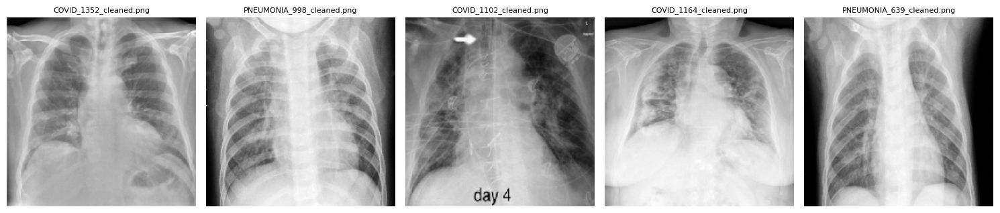


--- Klaster 1 ---
Liczba obrazów: 8


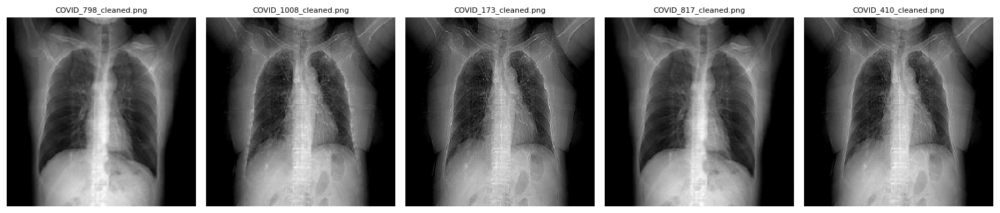


--- Klaster 2 ---
Liczba obrazów: 5


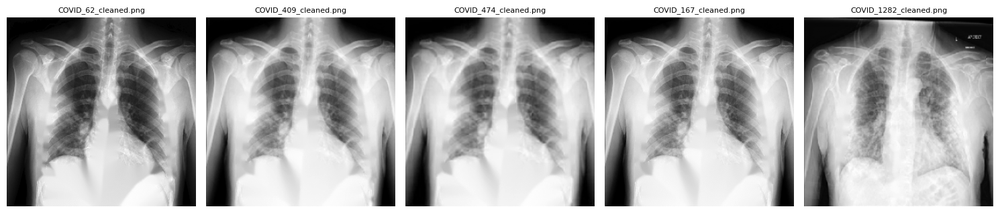


--- Klaster 3 ---
Liczba obrazów: 6


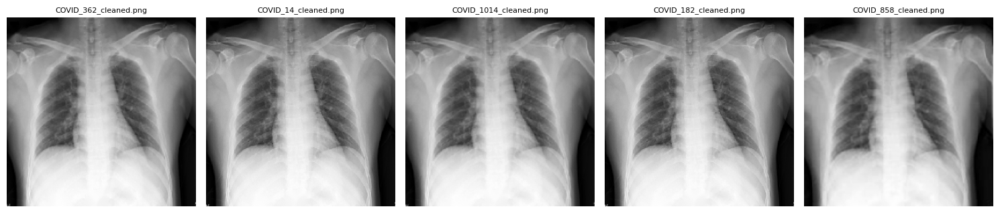

In [19]:
num_examples_per_cluster = 5

if n_clusters_dbscan == 0:
    print("DBSCAN nie znalazł żadnych klastrów (wszystko to szum).")
else:
    print(f"Przykładowe obrazy z {n_clusters_dbscan} klastrów DBSCAN:")

    for cluster_id in range(n_clusters_dbscan):
        print(f"\n--- Klaster {cluster_id} ---")

        is_in_dbscan_cluster = (dbscan_labels == cluster_id)
        dbscan_cluster_filenames = filenames_train[is_in_dbscan_cluster]
        num_files_in_cluster = len(dbscan_cluster_filenames)
        print(f"Liczba obrazów: {num_files_in_cluster}")

        if num_files_in_cluster == 0:
            print(f" - Brak plików w klastrze {cluster_id}.")
            continue

        cluster_filenames_list = list(dbscan_cluster_filenames)
        random.shuffle(cluster_filenames_list)
        examples_to_show_dbscan = cluster_filenames_list[:num_examples_per_cluster]

        plt.figure(figsize=(3 * len(examples_to_show_dbscan), 4))

        for i, filename in enumerate(examples_to_show_dbscan):
            image_path = processed_images_dir / filename
            img = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)

            if img is None:
                print(f"Błąd: Nie udało się wczytać {image_path}")
                continue

            plt.subplot(1, len(examples_to_show_dbscan), i + 1)
            plt.imshow(img, cmap='gray')
            plt.title(filename, fontsize=8)
            plt.axis('off')

        plt.tight_layout()
        plt.show()

Niestety wyniki zarówna K-means jak i DBSCAN nie są dla nas satysfakcjonujące. Choć klastry się formują, to nie odzwierciedlają one wyraźnie grup chorobowych, co jest dla nas kluczowym celem z perspektywy zastosowania medyczno-biznesowego.

Teraz sprawdzimy, czy wyekstrahowane cechy (features_pca) zawierają wystarczająco informacji, by rozróżnić między klasami (COVID, NORMAL, PNEUMONIA). W tym celu stosujemy Liniową Analizę Dyskryminacyjną (LDA), która maksymalizuje separację pomiędzy znanymi klasami i projektuje dane na przestrzeń 2D. Jeśli punkty na wykresie tworzą wyraźnie rozdzielone grupy, oznacza to, że klasteryzacja jest teoretycznie możliwa — czyli cechy dobrze oddają różnice między kategoriami.

In [20]:
original_dataset_base_path = Path(path)

# mapowanie: przetworzona_nazwa_pliku -> oryginalna_etykieta
processed_filename_to_original_label_map = {}

for class_dir in original_dataset_base_path.iterdir():
    if class_dir.is_dir():
        original_label = class_dir.name
        for original_img_path in class_dir.glob("*.*"):
            expected_cleaned_filename = original_img_path.stem + "_cleaned.png"
            processed_filename_to_original_label_map[expected_cleaned_filename] = original_label

# tworzenie etykiet dla plików treningowych
your_true_labels_list = []
for filename in filenames_train:
    if filename in processed_filename_to_original_label_map:
        your_true_labels_list.append(processed_filename_to_original_label_map[filename])
    else:
        print(f"brak etykiety dla pliku: {filename}")

your_true_labels = np.array(your_true_labels_list)

# walidacja zgodności liczby etykiet i cech
print(f"Liczba cech (features_pca): {features_pca.shape[0]}")
print(f"Liczba etykiet: {your_true_labels.shape[0]}")
if features_pca.shape[0] != your_true_labels.shape[0]:
    print("BŁĄD!")


Liczba cech (features_pca): 2560
Liczba etykiet: 2560


Mapowanie oryginalnych etykiet na numery:
  COVID -> 0
  NORMAL -> 1
  PNEUMONIA -> 2


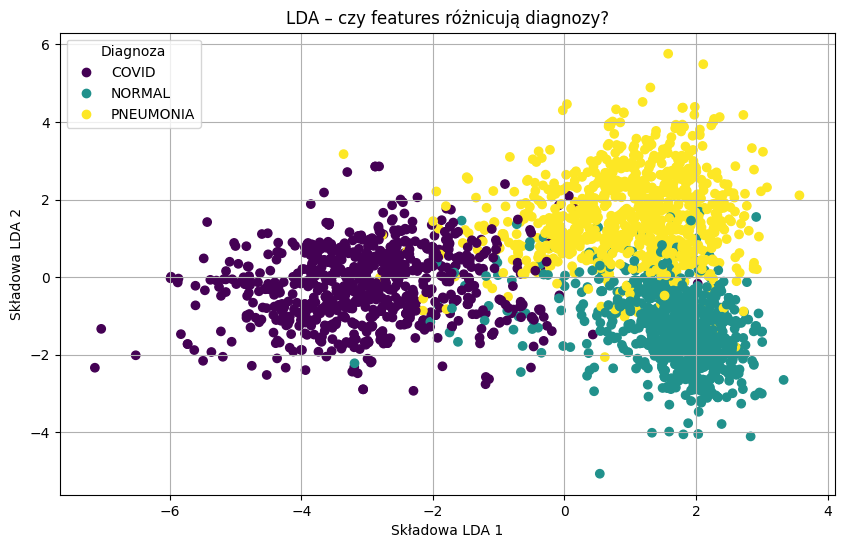

In [21]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
your_true_labels_encoded = label_encoder.fit_transform(your_true_labels)

print("Mapowanie oryginalnych etykiet na numery:")
for i, label in enumerate(label_encoder.classes_):
    print(f"  {label} -> {i}")

lda = LinearDiscriminantAnalysis(n_components=2)
features_lda = lda.fit_transform(features_pca, your_true_labels)

plt.figure(figsize=(10, 6))
scatter = plt.scatter(features_lda[:, 0], features_lda[:, 1], c=your_true_labels_encoded, cmap='viridis')
plt.title("LDA – czy features różnicują diagnozy?")
plt.xlabel("Składowa LDA 1")
plt.ylabel("Składowa LDA 2")

handles, _ = scatter.legend_elements()
original_labels = label_encoder.classes_
plt.legend(handles, original_labels, title="Diagnoza")

plt.grid(True)
plt.show()


Widać, że klasteryzacja jest możliwa! Ale można jeszcze ułatwić modelowi praće zmieniając metodą redukcji wymiarowości.

Postanowiliśmy zmienić PCA na UMAP jako metodę redukcji wymiarowości, ponieważ UMAP lepiej zachowuje zarówno lokalne, jak i globalne zależności między danymi, co może poprawić jakość klasteryzacji. Następnie ponownie przeprowadzimy klasteryzację z użyciem GMM, KMeans i DBSCAN na danych w przestrzeni 10D oraz porównujemy ich wyniki na wspólnej wizualizacji w 2D, aby sprawdzić, która metoda najlepiej oddziela grupy obrazów RTG.

Wybraliśmy przestrzeń 10-wymiarową jako kompromis między zachowaniem istotnych informacji zawartych w danych a ograniczeniem szumu i złożoności obliczeniowej. Testowaliśmy algorytmy dla kilku wymiarówmi zdecydowanie dla 10 osiągały najlepsze wyniki.

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


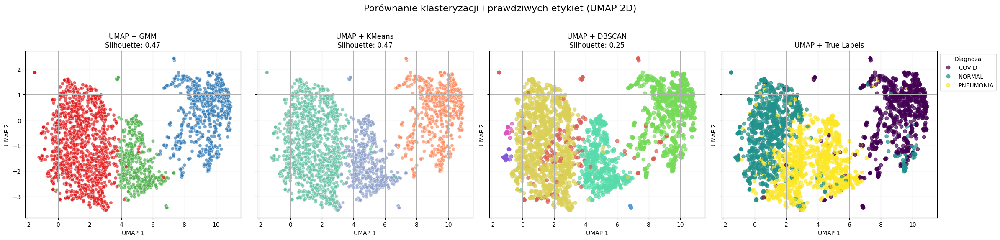

In [22]:
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
import umap

# Redukcja do 10D i 2D
umap_features = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=10, random_state=42).fit_transform(features_scaled)
umap_2d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42).fit_transform(features_scaled)

# Klasteryzacja
gmm = GaussianMixture(n_components=3, random_state=42)
gmm_labels = gmm.fit_predict(umap_features)

kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(umap_features)

dbscan = DBSCAN(eps=0.5, min_samples=10)
db_labels = dbscan.fit_predict(umap_features)

# Silhouette scores
sil_gmm = silhouette_score(umap_features, gmm_labels)
sil_kmeans = silhouette_score(umap_features, kmeans_labels)

if len(set(db_labels)) > 1 and len(set(db_labels)) != 1 + int(-1 in db_labels):
    sil_dbscan = silhouette_score(umap_features, db_labels)
else:
    sil_dbscan = None
fig, axs = plt.subplots(1, 4, figsize=(24, 6), sharex=True, sharey=True)

unique_labels_db = np.unique(db_labels)
palette_db = sns.color_palette("hls", len(unique_labels_db))
label_to_color = {label: palette_db[i] for i, label in enumerate(unique_labels_db)}
db_colors = [label_to_color[label] for label in db_labels]

sns.scatterplot(x=umap_2d[:, 0], y=umap_2d[:, 1], hue=gmm_labels, palette="Set1", ax=axs[0], alpha=0.7, legend=None)
axs[0].set_title(f"UMAP + GMM\nSilhouette: {sil_gmm:.2f}")

sns.scatterplot(x=umap_2d[:, 0], y=umap_2d[:, 1], hue=kmeans_labels, palette="Set2", ax=axs[1], alpha=0.7, legend=None)
axs[1].set_title(f"UMAP + KMeans\nSilhouette: {sil_kmeans:.2f}")

axs[2].scatter(umap_2d[:, 0], umap_2d[:, 1], c=db_colors, alpha=0.7)
title_db = f"UMAP + DBSCAN\nSilhouette: {sil_dbscan:.2f}" if sil_dbscan else "UMAP + DBSCAN\nSilhouette: n/a"
axs[2].set_title(title_db)

scatter = axs[3].scatter(umap_2d[:, 0], umap_2d[:, 1], c=your_true_labels_encoded, cmap="viridis", alpha=0.7)
axs[3].set_title("UMAP + True Labels")
handles, _ = scatter.legend_elements()
axs[3].legend(handles, label_encoder.classes_, title="Diagnoza", bbox_to_anchor=(1, 1))

for ax in axs:
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.grid(True)

plt.suptitle("Porównanie klasteryzacji i prawdziwych etykiet (UMAP 2D)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [23]:
from collections import defaultdict

# grupujemy pliki wg etykiet GMM
gmm_cluster_to_filenames = defaultdict(list)

for label, fname in zip(gmm_labels, filenames_train):
    gmm_cluster_to_filenames[label].append(fname)

# iterujemy po klastrach GMM
for cluster_id in sorted(gmm_cluster_to_filenames.keys()):
    print(f"Klaster GMM {cluster_id}:")

    filenames = gmm_cluster_to_filenames[cluster_id]
    sample_files = random.sample(filenames, min(5, len(filenames)))

    for f in sample_files:
        print(f" - {f}")


Klaster GMM 0:
 - NORMAL_1083_cleaned.png
 - NORMAL_948_cleaned.png
 - NORMAL_1040_cleaned.png
 - NORMAL_1196_cleaned.png
 - PNEUMONIA_195_cleaned.png
Klaster GMM 1:
 - COVID_967_cleaned.png
 - COVID_1005_cleaned.png
 - PNEUMONIA_452_cleaned.png
 - COVID_718_cleaned.png
 - COVID_1212_cleaned.png
Klaster GMM 2:
 - PNEUMONIA_382_cleaned.png
 - PNEUMONIA_92_cleaned.png
 - NORMAL_1639_cleaned.png
 - COVID_648_cleaned.png
 - PNEUMONIA_1120_cleaned.png


In [24]:
# grupowanie plików wg etykiet KMeans
kmeans_cluster_to_filenames = defaultdict(list)

for label, fname in zip(kmeans_labels, filenames_train):
    kmeans_cluster_to_filenames[label].append(fname)

# iteracja po klastrach KMeans
for cluster_id in sorted(kmeans_cluster_to_filenames.keys()):
    print(f"Klaster KMeans {cluster_id}:")

    filenames = kmeans_cluster_to_filenames[cluster_id]
    sample_files = random.sample(filenames, min(5, len(filenames)))

    for f in sample_files:
        print(f" - {f}")


Klaster KMeans 0:
 - PNEUMONIA_288_cleaned.png
 - NORMAL_171_cleaned.png
 - NORMAL_824_cleaned.png
 - PNEUMONIA_596_cleaned.png
 - NORMAL_259_cleaned.png
Klaster KMeans 1:
 - COVID_468_cleaned.png
 - COVID_895_cleaned.png
 - COVID_1013_cleaned.png
 - COVID_1377_cleaned.png
 - COVID_501_cleaned.png
Klaster KMeans 2:
 - PNEUMONIA_895_cleaned.png
 - PNEUMONIA_606_cleaned.png
 - PNEUMONIA_1260_cleaned.png
 - PNEUMONIA_966_cleaned.png
 - PNEUMONIA_279_cleaned.png


In [25]:
# grupujemy pliki wg etykiet klastrów
cluster_to_filenames = defaultdict(list)

for label, fname in zip(db_labels, filenames_train):
    cluster_to_filenames[label].append(fname)

# iterujemy po znalezionych klastrach
for cluster_id in sorted(cluster_to_filenames.keys()):
    if cluster_id == -1:
        print("\Klaster -1 (szum):")
    else:
        print(f"Klaster {cluster_id}:")

    filenames = cluster_to_filenames[cluster_id]
    sample_files = random.sample(filenames, min(5, len(filenames)))

    for f in sample_files:
        print(f" - {f}")


\Klaster -1 (szum):
 - NORMAL_1593_cleaned.png
 - PNEUMONIA_1651_cleaned.png
 - PNEUMONIA_183_cleaned.png
 - PNEUMONIA_940_cleaned.png
 - COVID_324_cleaned.png
Klaster 0:
 - NORMAL_850_cleaned.png
 - NORMAL_1579_cleaned.png
 - NORMAL_1055_cleaned.png
 - NORMAL_1677_cleaned.png
 - NORMAL_243_cleaned.png
Klaster 1:
 - COVID_1417_cleaned.png
 - COVID_1437_cleaned.png
 - COVID_1312_cleaned.png
 - COVID_989_cleaned.png
 - COVID_1481_cleaned.png
Klaster 2:
 - PNEUMONIA_1599_cleaned.png
 - PNEUMONIA_1069_cleaned.png
 - PNEUMONIA_1568_cleaned.png
 - PNEUMONIA_331_cleaned.png
 - PNEUMONIA_1016_cleaned.png
Klaster 3:
 - COVID_797_cleaned.png
 - COVID_810_cleaned.png
 - COVID_798_cleaned.png
 - COVID_173_cleaned.png
 - COVID_818_cleaned.png
Klaster 4:
 - NORMAL_1612_cleaned.png
 - NORMAL_1626_cleaned.png
 - NORMAL_94_cleaned.png
 - NORMAL_142_cleaned.png
 - NORMAL_635_cleaned.png
Klaster 5:
 - NORMAL_89_cleaned.png
 - NORMAL_1773_cleaned.png
 - NORMAL_710_cleaned.png
 - PNEUMONIA_306_cleaned.png


W kontekście medycznym najlepsze do oceny jakości naszej klasteryzacji są Adjusted Rand Index (ARI), Normalized Mutual Information (NMI) oraz Purity, ponieważ umożliwiają porównanie wyników klasteryzacji z rzeczywistymi diagnozami pacjentów. ARI jest najbardziej wiarygodny, ponieważ uwzględnia zgodność losową i dokładnie ocenia trafność przypisań — co jest kluczowe w diagnostyce, gdzie błędy mogą mieć poważne skutki. NMI pozwala zrozumieć, ile użytecznej informacji o chorobie zawierają klastry, co jest istotne przy rozwijaniu modeli pomocniczych dla lekarzy. Purity z kolei jest intuicyjna i łatwa do interpretacji przez personel medyczny, ponieważ pokazuje, na ile klastry odpowiadają jednej konkretnej chorobie — co ułatwia praktyczne wdrożenie systemu AI w szpitalu.

In [26]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

def purity_score(true_labels, cluster_labels):
    contingency_matrix = np.zeros((np.max(true_labels)+1, np.max(cluster_labels)+1), dtype=np.int32)

    for t, c in zip(true_labels, cluster_labels):
        contingency_matrix[t, c] += 1

    return np.sum(np.max(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# ARI, NMI, Purity – GMM
print("GMM:")
print("ARI :", adjusted_rand_score(your_true_labels_encoded, gmm_labels))
print("NMI :", normalized_mutual_info_score(your_true_labels_encoded, gmm_labels))
print("Purity:", purity_score(your_true_labels_encoded, gmm_labels))

# ARI, NMI, Purity – KMeans
print("KMeans:")
print("ARI :", adjusted_rand_score(your_true_labels_encoded, kmeans_labels))
print("NMI :", normalized_mutual_info_score(your_true_labels_encoded, kmeans_labels))
print("Purity:", purity_score(your_true_labels_encoded, kmeans_labels))

# ARI, NMI, Purity – DBSCAN
if len(set(db_labels)) > 1 and len(set(db_labels)) != 1 + int(-1 in db_labels):
    filtered_idx = db_labels != -1
    print("DBSCAN (bez szumu):")
    print("ARI :", adjusted_rand_score(your_true_labels_encoded[filtered_idx], db_labels[filtered_idx]))
    print("NMI :", normalized_mutual_info_score(your_true_labels_encoded[filtered_idx], db_labels[filtered_idx]))
    print("Purity:", purity_score(your_true_labels_encoded[filtered_idx], db_labels[filtered_idx]))
else:
    print("DBSCAN: zbyt mało klastrów lub tylko szum – pomijam metryki.")


GMM:
ARI : 0.5009550927944785
NMI : 0.5391042159034876
Purity: 0.76640625
KMeans:
ARI : 0.5112653555093105
NMI : 0.5454811044530062
Purity: 0.776953125
DBSCAN (bez szumu):
ARI : 0.5279236725541376
NMI : 0.5545436214554142
Purity: 0.7985880398671097


# TESTOWANIE NA ZBIORZE WALIDACYJNYM

In [27]:
# lista nazw plików val
val_files = set([f.name for f in Path("split_data/val").rglob("*.png")])

features = np.load("features_autoencoder.npy")
filenames = np.load("filenames.npy")

# indeksy tylko dla zbioru val
val_indices = [i for i, name in enumerate(filenames) if name in val_files]

features_val = features[val_indices]
filenames_val = filenames[val_indices]

# normalizacja
scaler = StandardScaler()
features_scaled = scaler.fit_transform(features_val)

In [28]:
original_dataset_base_path = Path(path)

# mapowanie: przetworzona_nazwa_pliku -> oryginalna_etykieta
processed_filename_to_original_label_map = {}

for class_dir in original_dataset_base_path.iterdir():
    if class_dir.is_dir():
        original_label = class_dir.name
        for original_img_path in class_dir.glob("*.*"):
            expected_cleaned_filename = original_img_path.stem + "_cleaned.png"
            processed_filename_to_original_label_map[expected_cleaned_filename] = original_label

# tworzenie etykiet dla plików walidacyjnych
your_true_labels_list = []
for filename in filenames_val:
    if filename in processed_filename_to_original_label_map:
        your_true_labels_list.append(processed_filename_to_original_label_map[filename])
    else:
        print(f"brak etykiety dla pliku: {filename}")

your_true_labels = np.array(your_true_labels_list)

In [29]:
label_encoder = LabelEncoder()
your_true_labels_encoded = label_encoder.fit_transform(your_true_labels)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


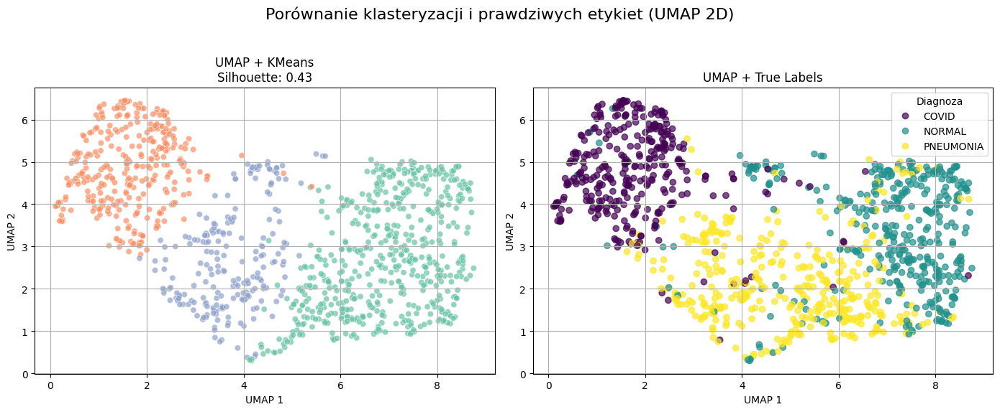

In [30]:
umap_10d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=10, random_state=42).fit_transform(features_scaled)
umap_2d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42).fit_transform(features_scaled)

# Klasteryzacja
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans_labels = kmeans.fit_predict(umap_10d)

# Silhouette score
sil_kmeans = silhouette_score(umap_10d, kmeans_labels)

fig, axs = plt.subplots(1, 2, figsize=(14, 6))

sns.scatterplot(x=umap_2d[:, 0], y=umap_2d[:, 1], hue=kmeans_labels, palette="Set2", ax=axs[0], alpha=0.7, legend=None)
axs[0].set_title(f"UMAP + KMeans\nSilhouette: {sil_kmeans:.2f}")

scatter = axs[1].scatter(umap_2d[:, 0], umap_2d[:, 1], c=your_true_labels_encoded, cmap="viridis", alpha=0.7)
axs[1].set_title("UMAP + True Labels")
handles, _ = scatter.legend_elements()
axs[1].legend(handles, label_encoder.classes_, title="Diagnoza", bbox_to_anchor=(1, 1))

for ax in axs:
    ax.set_xlabel("UMAP 1")
    ax.set_ylabel("UMAP 2")
    ax.grid(True)

plt.suptitle("Porównanie klasteryzacji i prawdziwych etykiet (UMAP 2D)", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [31]:
def purity_score(true_labels, cluster_labels):
    contingency_matrix = np.zeros((np.max(true_labels)+1, np.max(cluster_labels)+1), dtype=np.int32)

    for t, c in zip(true_labels, cluster_labels):
        contingency_matrix[t, c] += 1

    return np.sum(np.max(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

# ARI, NMI, Purity – KMeans dla val
print("KMeans:")
print("ARI :", adjusted_rand_score(your_true_labels_encoded, kmeans_labels))
print("NMI :", normalized_mutual_info_score(your_true_labels_encoded, kmeans_labels))
print("Purity:", purity_score(your_true_labels_encoded, kmeans_labels))


KMeans:
ARI : 0.4623994316675087
NMI : 0.48503018801008807
Purity: 0.7365542388331814


# TESTOWANIE NA ZBIORZE TESTOWYM - DLA GRUPY WALIDUJĄCEJ

Wystarczy w poniższym kodzie zamienić *** na "test" i się powinno odpalić. Zalecamy przetestowanie też np innych metryk itp:)

In [32]:
# ***_files = set([f.name for f in Path("split_data/***").glob("*.png")])

# features = np.load("features_autoencoder.npy")
# filenames = np.load("filenames.npy")

# ***_indices = [i for i, name in enumerate(filenames) if name in ***_files]

# features_*** = features[***_indices]
# filenames_*** = filenames[***_indices]

# scaler = StandardScaler()
# features_scaled = scaler.fit_transform(features_***)

# original_dataset_base_path = Path(path)
# processed_filename_to_original_label_map = {}

# for class_dir in original_dataset_base_path.iterdir():
#     if class_dir.is_dir():
#         original_label = class_dir.name
#         for original_img_path in class_dir.glob("*.*"):
#             expected_cleaned_filename = original_img_path.stem + "_cleaned.png"
#             processed_filename_to_original_label_map[expected_cleaned_filename] = original_label

# your_true_labels_list = []
# for filename in filenames_***:
#     if filename in processed_filename_to_original_label_map:
#         your_true_labels_list.append(processed_filename_to_original_label_map[filename])
#     else:
#         print(f"brak etykiety dla pliku: {filename}")

# label_encoder = LabelEncoder()
# your_true_labels_encoded = label_encoder.fit_transform(your_true_labels)

# umap_10d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=10, random_state=42).fit_transform(features_scaled)
# umap_2d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42).fit_transform(features_scaled)

# # Klasteryzacja
# kmeans = KMeans(n_clusters=3, random_state=42)
# kmeans_labels = kmeans.fit_predict(umap_10d)

# # Silhouette score
# sil_kmeans = silhouette_score(umap_10d, kmeans_labels)

# fig, axs = plt.subplots(1, 2, figsize=(14, 6))

# # Wykres KMeans
# sns.scatterplot(x=umap_2d[:, 0], y=umap_2d[:, 1], hue=kmeans_labels, palette="Set2", ax=axs[0], alpha=0.7, legend=None)
# axs[0].set_title(f"UMAP + KMeans\nSilhouette: {sil_kmeans:.2f}")

# # Wykres z prawdziwymi etykietami
# scatter = axs[1].scatter(umap_2d[:, 0], umap_2d[:, 1], c=your_true_labels_encoded, cmap="viridis", alpha=0.7)
# axs[1].set_title("UMAP + True Labels")
# handles, _ = scatter.legend_elements()
# axs[1].legend(handles, label_encoder.classes_, title="Diagnoza", bbox_to_anchor=(1, 1))

# # Ustawienia osi i siatki
# for ax in axs:
#     ax.set_xlabel("UMAP 1")
#     ax.set_ylabel("UMAP 2")
#     ax.grid(True)

# plt.suptitle("Porównanie klasteryzacji i prawdziwych etykiet (UMAP 2D)", fontsize=16)
# plt.tight_layout(rect=[0, 0.03, 1, 0.95])
# plt.show()

# **INTERPRETACJA**

ANALIZA WYNIKÓW KLASTERYZACJI ZDJĘĆ PŁUC

1. PODSTAWOWE STATYSTYKI:
----------------------------------------
Liczba próbek: 1097
Liczba prawdziwych klas: 3
Liczba klastrów: 3
Nazwy klas: [np.str_('COVID'), np.str_('NORMAL'), np.str_('PNEUMONIA')]

Rozkład prawdziwych klas:
  COVID: 341 (31.1%)
  NORMAL: 378 (34.5%)
  PNEUMONIA: 378 (34.5%)

Rozkład klastrów:
  Klaster 0: 548 (50.0%)
  Klaster 1: 333 (30.4%)
  Klaster 2: 216 (19.7%)

2. METRYKI OCENY KLASTERYZACJI:
----------------------------------------
Metryki porównania z prawdziwymi etykietami:
  ARI (Adjusted Rand Index): 0.4624
  NMI (Normalized Mutual Information): 0.4850
  Purity Score: 0.7366

Metryki jakości klasteryzacji:
  Silhouette Score: 0.4297
  Calinski-Harabasz Index: 1709.35
  Davies-Bouldin Index: 0.9334

3. ANALIZA PRZYPISAŃ KLAS DO KLASTRÓW:
----------------------------------------
Macierz kontyngencji (klasy vs klastry):
           Klaster 0  Klaster 1  Klaster 2
COVID              5        314         22
NORMAL 

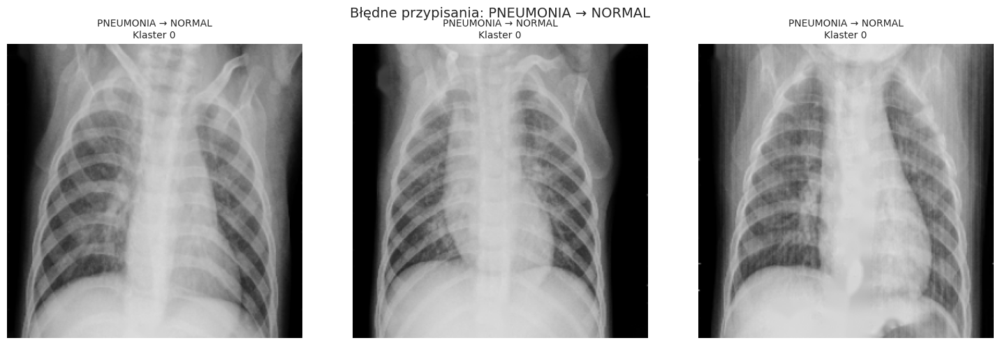

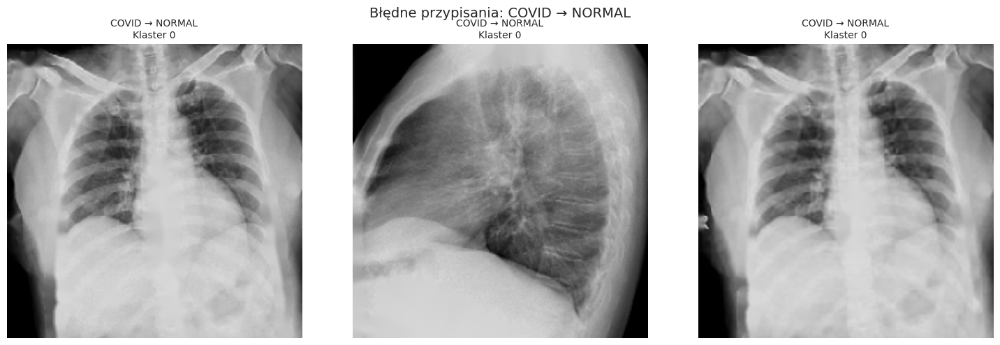

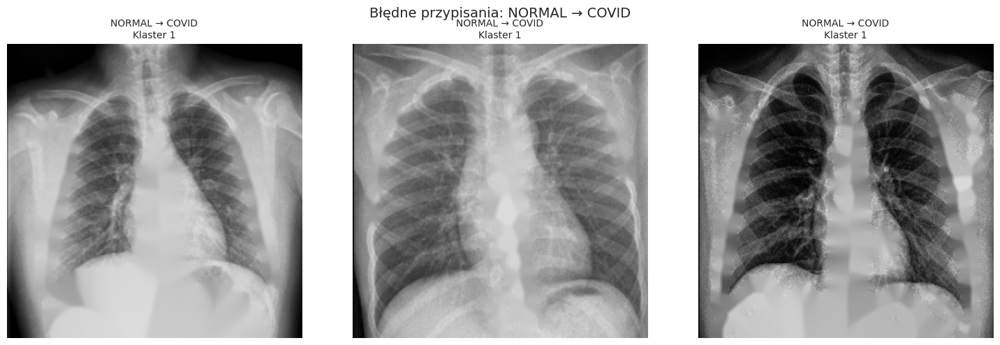

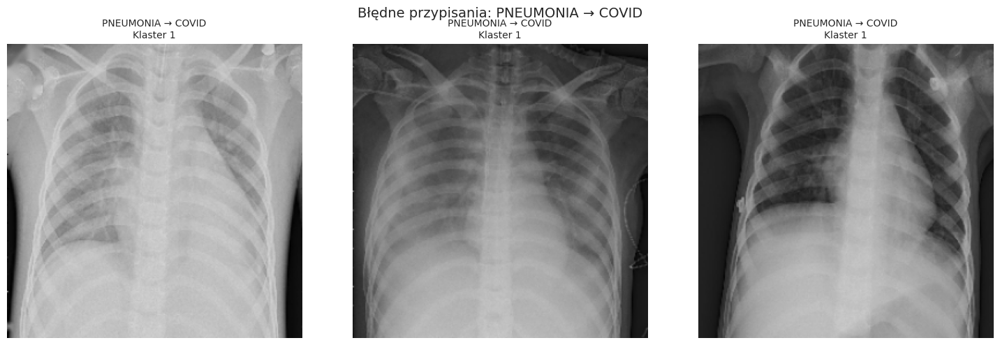

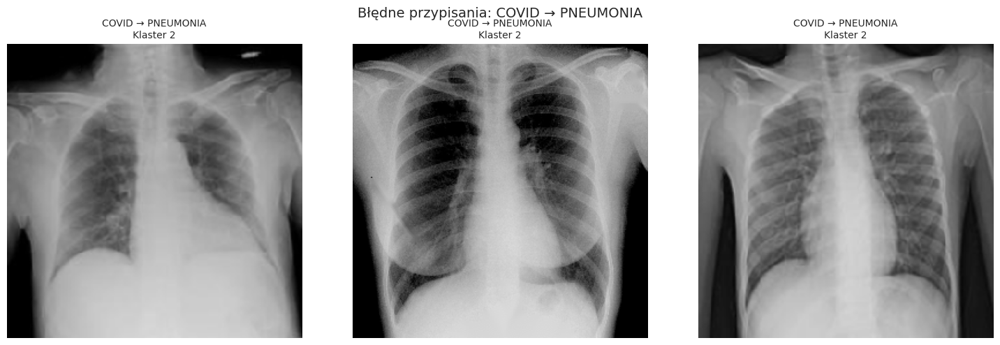

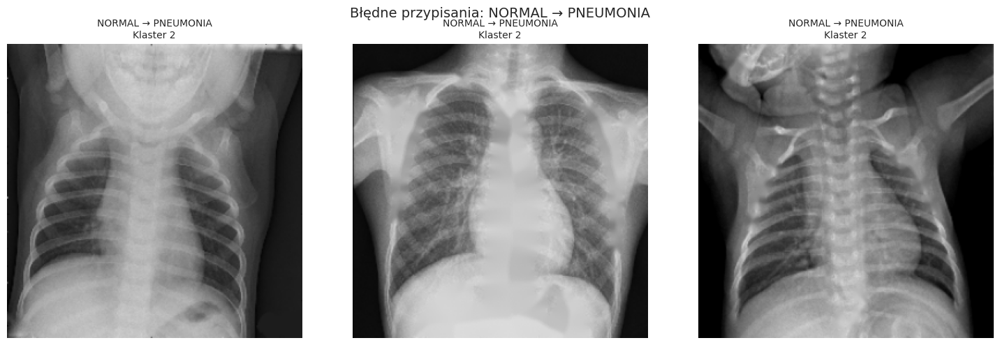

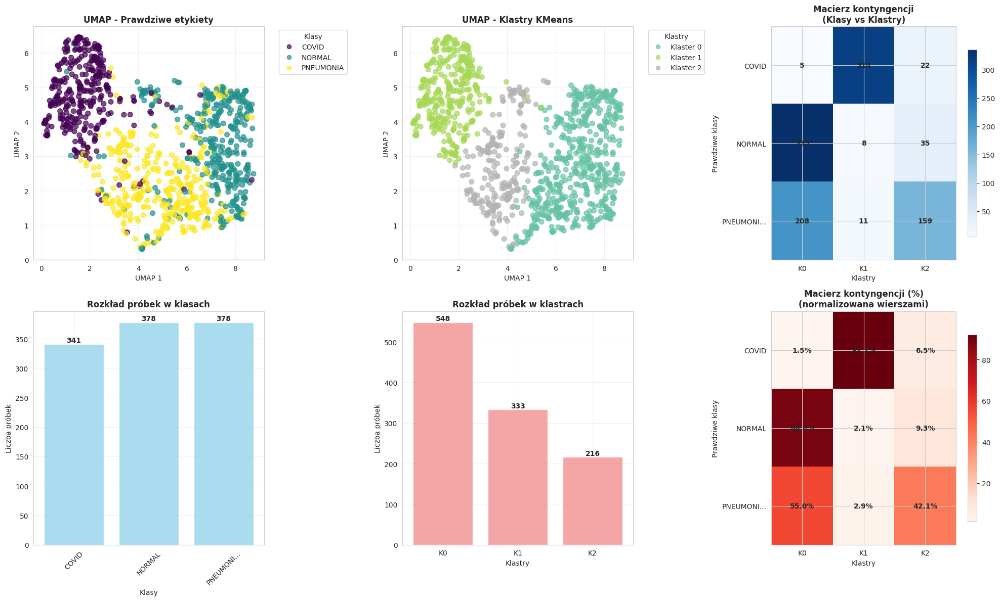


6. REKOMENDACJE I WNIOSKI:
----------------------------------------
Ogólna skuteczność klasteryzacji: 73.7%
Liczba klastrów vs liczba klas prawdziwych: 3 vs 3
Najlepiej rozpoznawana klasa: COVID
Najgorzej rozpoznawana klasa: PNEUMONIA


In [43]:
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score
from collections import Counter, defaultdict
import warnings
from PIL import Image
import pandas as pd
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10
sns.set_style("whitegrid")

def comprehensive_clustering_analysis(true_labels_encoded, cluster_labels, umap_2d, umap_10d,
                                    label_encoder, filenames_val):
    """
    Kompleksowa analiza wyników klasteryzacji
    """

    print("="*80)
    print("ANALIZA WYNIKÓW KLASTERYZACJI ZDJĘĆ PŁUC")
    print("="*80)

    # 1. PODSTAWOWE STATYSTYKI
    print("\n1. PODSTAWOWE STATYSTYKI:")
    print("-" * 40)
    n_true_classes = len(np.unique(true_labels_encoded))
    n_clusters = len(np.unique(cluster_labels))
    n_samples = len(true_labels_encoded)

    print(f"Liczba próbek: {n_samples}")
    print(f"Liczba prawdziwych klas: {n_true_classes}")
    print(f"Liczba klastrów: {n_clusters}")
    print(f"Nazwy klas: {list(label_encoder.classes_)}")


    true_counts = Counter(true_labels_encoded)
    cluster_counts = Counter(cluster_labels)

    print(f"\nRozkład prawdziwych klas:")
    for i, class_name in enumerate(label_encoder.classes_):
        count = true_counts[i]
        percentage = (count / n_samples) * 100
        print(f"  {class_name}: {count} ({percentage:.1f}%)")

    print(f"\nRozkład klastrów:")
    for cluster_id, count in sorted(cluster_counts.items()):
        percentage = (count / n_samples) * 100
        print(f"  Klaster {cluster_id}: {count} ({percentage:.1f}%)")

    # 2. METRYKI OCENY KLASTERYZACJI
    print("\n2. METRYKI OCENY KLASTERYZACJI:")
    print("-" * 40)

    ari = adjusted_rand_score(true_labels_encoded, cluster_labels)
    nmi = normalized_mutual_info_score(true_labels_encoded, cluster_labels)
    purity = purity_score(true_labels_encoded, cluster_labels)

    silhouette = silhouette_score(umap_10d, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(umap_10d, cluster_labels)
    davies_bouldin = davies_bouldin_score(umap_10d, cluster_labels)

    print(f"Metryki porównania z prawdziwymi etykietami:")
    print(f"  ARI (Adjusted Rand Index): {ari:.4f}")
    print(f"  NMI (Normalized Mutual Information): {nmi:.4f}")
    print(f"  Purity Score: {purity:.4f}")

    print(f"\nMetryki jakości klasteryzacji:")
    print(f"  Silhouette Score: {silhouette:.4f}")
    print(f"  Calinski-Harabasz Index: {calinski_harabasz:.2f}")
    print(f"  Davies-Bouldin Index: {davies_bouldin:.4f}")

    # 3. MACIERZ KONTYNGENCJI
    print("\n3. ANALIZA PRZYPISAŃ KLAS DO KLASTRÓW:")
    print("-" * 40)

    contingency_matrix = confusion_matrix(true_labels_encoded, cluster_labels)

    print("Macierz kontyngencji (klasy vs klastry):")
    df_contingency = pd.DataFrame(contingency_matrix,
                                 index=[f"{label_encoder.classes_[i]}" for i in range(n_true_classes)],
                                 columns=[f"Klaster {i}" for i in range(n_clusters)])
    print(df_contingency)

    # analiza dominujących klas w każdym klastrze
    print(f"\nDominujące klasy w każdym klastrze:")
    for cluster_id in range(n_clusters):
        cluster_mask = cluster_labels == cluster_id
        cluster_true_labels = true_labels_encoded[cluster_mask]

        if len(cluster_true_labels) > 0:
            dominant_class = Counter(cluster_true_labels).most_common(1)[0]
            dominant_class_name = label_encoder.classes_[dominant_class[0]]
            dominant_count = dominant_class[1]
            total_in_cluster = len(cluster_true_labels)
            purity_cluster = (dominant_count / total_in_cluster) * 100

            print(f"  Klaster {cluster_id}: {dominant_class_name} "
                  f"({dominant_count}/{total_in_cluster} próbek, {purity_cluster:.1f}%)")

    # 4. ANALIZA BŁĘDÓW KLASTERYZACJI
    print("\n4. ANALIZA BŁĘDÓW KLASTERYZACJI:")
    print("-" * 40)

    analyze_clustering_errors(true_labels_encoded, cluster_labels, label_encoder, filenames_val)

    # 5. WIZUALIZACJE
    create_comprehensive_visualizations(true_labels_encoded, cluster_labels, umap_2d,
                                      label_encoder, contingency_matrix)

    # 6. REKOMENDACJE
    print("\n6. REKOMENDACJE I WNIOSKI:")
    print("-" * 40)
    provide_recommendations(ari, nmi, purity, silhouette, n_true_classes, n_clusters,
                          contingency_matrix, label_encoder)

def purity_score(true_labels, cluster_labels):
    contingency_matrix = np.zeros((np.max(true_labels)+1, np.max(cluster_labels)+1), dtype=np.int32)

    for t, c in zip(true_labels, cluster_labels):
        contingency_matrix[t, c] += 1

    return np.sum(np.max(contingency_matrix, axis=0)) / np.sum(contingency_matrix)

def analyze_clustering_errors(true_labels_encoded, cluster_labels, label_encoder, filenames_val, max_examples_per_type=3):
    """Analiza błędów klasteryzacji i pokazanie przykładów dla każdego typu błędu"""

    misclassified_by_type = defaultdict(list)
    total_samples = len(true_labels_encoded)

    for cluster_id in np.unique(cluster_labels):
        cluster_mask = cluster_labels == cluster_id
        cluster_true_labels = true_labels_encoded[cluster_mask]
        if len(cluster_true_labels) == 0:
            continue

        # najczęstsza etykieta w klastrze
        dominant_class = Counter(cluster_true_labels).most_common(1)[0][0]
        cluster_indices = np.where(cluster_mask)[0]

        for idx in cluster_indices:
            if true_labels_encoded[idx] != dominant_class:
                true_class = label_encoder.classes_[true_labels_encoded[idx]]
                dominant_class_label = label_encoder.classes_[dominant_class]
                error_key = f"{true_class} → {dominant_class_label}"

                misclassified_by_type[error_key].append({
                    'filename': filenames_val[idx],
                    'true_class': true_class,
                    'assigned_cluster': cluster_id,
                    'dominant_class_in_cluster': dominant_class_label
                })

    total_misclassified = sum(len(v) for v in misclassified_by_type.values())
    accuracy = 100 * (1 - total_misclassified / total_samples)

    print(f"Źle przypisane próbki: {total_misclassified}/{total_samples} ({100 - accuracy:.1f}%)")
    print(f"Dokładność klasteryzacji: {accuracy:.1f}%\n")

    print("Najczęstsze typy błędów:")
    for error_type, samples in sorted(misclassified_by_type.items(), key=lambda x: len(x[1]), reverse=True):
        percentage = (len(samples) / total_samples) * 100
        print(f"  {error_type}: {len(samples)} przykładów ({percentage:.1f}%)")

    # wyświetlamy po kilka przykładów z każdego typu błędu
    display_misclassified_images_by_type(misclassified_by_type, max_examples_per_type=max_examples_per_type)

def display_misclassified_images_by_type(misclassified_by_type, max_examples_per_type=3):
    """Wyświetla błędnie przypisane obrazy grupując je wg typu błędu"""

    for error_type, samples in misclassified_by_type.items():
        selected_samples = samples[:max_examples_per_type]
        n = len(selected_samples)

        fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
        if n == 1:
            axes = [axes]

        for ax, sample in zip(axes, selected_samples):
            image_path = None
            # szukamy w folderze split_data/val
            val_path = os.path.join("split_data/val", sample['filename'])
            if os.path.exists(val_path):
                image_path = val_path
            else:
                for root, _, files in os.walk("split_data/val"):
                    if sample['filename'] in files:
                        image_path = os.path.join(root, sample['filename'])
                        break

            if image_path and os.path.exists(image_path):
                try:
                    img = Image.open(image_path)
                    if img.mode != 'RGB':
                        img = img.convert('RGB')
                    ax.imshow(img)
                except Exception as e:
                    ax.text(0.5, 0.5, f"Błąd: {str(e)[:30]}", ha='center', va='center')
            else:
                ax.text(0.5, 0.5, "Nie znaleziono pliku", ha='center', va='center')

            ax.set_title(f"{sample['true_class']} → {sample['dominant_class_in_cluster']}\nKlaster {sample['assigned_cluster']}", fontsize=10)
            ax.axis('off')

        plt.suptitle(f"Błędne przypisania: {error_type}", fontsize=14)
        plt.tight_layout()
        plt.show()

def create_comprehensive_visualizations(true_labels_encoded, cluster_labels, umap_2d,
                                      label_encoder, contingency_matrix):

    fig = plt.figure(figsize=(20, 12))

    # UMAP z prawdziwymi etykietami
    ax1 = fig.add_subplot(2, 3, 1)
    scatter1 = ax1.scatter(umap_2d[:, 0], umap_2d[:, 1], c=true_labels_encoded,
                          cmap='viridis', alpha=0.7, s=50)
    ax1.set_title('UMAP - Prawdziwe etykiety', fontsize=12, fontweight='bold')
    ax1.set_xlabel('UMAP 1')
    ax1.set_ylabel('UMAP 2')
    ax1.grid(True, alpha=0.3)

    # legenda dla prawdziwych etykiet
    handles1, _ = scatter1.legend_elements()
    ax1.legend(handles1, label_encoder.classes_, title="Klasy",
              bbox_to_anchor=(1.05, 1), loc='upper left')

    # UMAP z klastrami
    ax2 = fig.add_subplot(2, 3, 2)
    scatter2 = ax2.scatter(umap_2d[:, 0], umap_2d[:, 1], c=cluster_labels,
                          cmap='Set2', alpha=0.7, s=50)
    ax2.set_title('UMAP - Klastry KMeans', fontsize=12, fontweight='bold')
    ax2.set_xlabel('UMAP 1')
    ax2.set_ylabel('UMAP 2')
    ax2.grid(True, alpha=0.3)

    # legenda dla klastrów
    handles2, _ = scatter2.legend_elements()
    cluster_names = [f'Klaster {i}' for i in range(len(handles2))]
    ax2.legend(handles2, cluster_names, title="Klastry",
              bbox_to_anchor=(1.05, 1), loc='upper left')

    # heatmapa macierzy kontyngencji
    ax3 = fig.add_subplot(2, 3, 3)
    im = ax3.imshow(contingency_matrix, cmap='Blues', aspect='auto')
    ax3.set_xticks(range(contingency_matrix.shape[1]))
    ax3.set_yticks(range(contingency_matrix.shape[0]))
    ax3.set_xticklabels([f'K{i}' for i in range(contingency_matrix.shape[1])])
    ax3.set_yticklabels([f'{name[:8]}...' if len(name) > 8 else name
                        for name in label_encoder.classes_])
    ax3.set_title('Macierz kontyngencji\n(Klasy vs Klastry)', fontsize=12, fontweight='bold')
    ax3.set_xlabel('Klastry')
    ax3.set_ylabel('Prawdziwe klasy')

    for i in range(contingency_matrix.shape[0]):
        for j in range(contingency_matrix.shape[1]):
            ax3.text(j, i, str(contingency_matrix[i, j]),
                    ha="center", va="center", fontweight='bold')

    plt.colorbar(im, ax=ax3, shrink=0.8)

    # wykres słupkowy rozkładu klas
    ax4 = fig.add_subplot(2, 3, 4)
    class_counts = [np.sum(true_labels_encoded == i) for i in range(len(label_encoder.classes_))]
    bars1 = ax4.bar(range(len(label_encoder.classes_)), class_counts,
                    alpha=0.7, color='skyblue', label='Prawdziwe klasy')
    ax4.set_title('Rozkład próbek w klasach', fontsize=12, fontweight='bold')
    ax4.set_xlabel('Klasy')
    ax4.set_ylabel('Liczba próbek')
    ax4.set_xticks(range(len(label_encoder.classes_)))
    ax4.set_xticklabels([name[:8] + '...' if len(name) > 8 else name
                        for name in label_encoder.classes_], rotation=45)
    ax4.grid(True, alpha=0.3)

    for i, bar in enumerate(bars1):
        height = bar.get_height()
        ax4.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{int(height)}', ha='center', va='bottom', fontweight='bold')

    # wykres słupkowy rozkładu klastrów
    ax5 = fig.add_subplot(2, 3, 5)
    cluster_counts = [np.sum(cluster_labels == i) for i in range(len(np.unique(cluster_labels)))]
    bars2 = ax5.bar(range(len(cluster_counts)), cluster_counts,
                    alpha=0.7, color='lightcoral', label='Klastry')
    ax5.set_title('Rozkład próbek w klastrach', fontsize=12, fontweight='bold')
    ax5.set_xlabel('Klastry')
    ax5.set_ylabel('Liczba próbek')
    ax5.set_xticks(range(len(cluster_counts)))
    ax5.set_xticklabels([f'K{i}' for i in range(len(cluster_counts))])
    ax5.grid(True, alpha=0.3)

    for i, bar in enumerate(bars2):
        height = bar.get_height()
        ax5.text(bar.get_x() + bar.get_width()/2., height + 0.5,
                f'{int(height)}', ha='center', va='bottom', fontweight='bold')

    # heatmapa znormalizowanej macierzy kontyngencji (procenty)
    ax6 = fig.add_subplot(2, 3, 6)
    contingency_normalized = contingency_matrix / contingency_matrix.sum(axis=1, keepdims=True) * 100
    im2 = ax6.imshow(contingency_normalized, cmap='Reds', aspect='auto')
    ax6.set_xticks(range(contingency_matrix.shape[1]))
    ax6.set_yticks(range(contingency_matrix.shape[0]))
    ax6.set_xticklabels([f'K{i}' for i in range(contingency_matrix.shape[1])])
    ax6.set_yticklabels([f'{name[:8]}...' if len(name) > 8 else name
                        for name in label_encoder.classes_])
    ax6.set_title('Macierz kontyngencji (%)\n(normalizowana wierszami)', fontsize=12, fontweight='bold')
    ax6.set_xlabel('Klastry')
    ax6.set_ylabel('Prawdziwe klasy')

    # wartości procentowe
    for i in range(contingency_normalized.shape[0]):
        for j in range(contingency_normalized.shape[1]):
            ax6.text(j, i, f'{contingency_normalized[i, j]:.1f}%',
                    ha="center", va="center", fontweight='bold')

    plt.colorbar(im2, ax=ax6, shrink=0.8)

    plt.tight_layout()
    plt.show()

def provide_recommendations(ari, nmi, purity, silhouette, n_true_classes, n_clusters,
                          contingency_matrix, label_encoder):
    """Proste rekomendacje bez interpretacji"""
    accuracy = purity * 100
    print(f"Ogólna skuteczność klasteryzacji: {accuracy:.1f}%")
    print(f"Liczba klastrów vs liczba klas prawdziwych: {n_clusters} vs {n_true_classes}")

    best_class_idx = np.argmax([np.max(contingency_matrix[i]) / np.sum(contingency_matrix[i])
                               for i in range(len(label_encoder.classes_))])
    worst_class_idx = np.argmin([np.max(contingency_matrix[i]) / np.sum(contingency_matrix[i])
                                for i in range(len(label_encoder.classes_))])

    print(f"Najlepiej rozpoznawana klasa: {label_encoder.classes_[best_class_idx]}")
    print(f"Najgorzej rozpoznawana klasa: {label_encoder.classes_[worst_class_idx]}")


comprehensive_clustering_analysis(your_true_labels_encoded, kmeans_labels, umap_2d, umap_10d,
                                label_encoder, filenames_val)

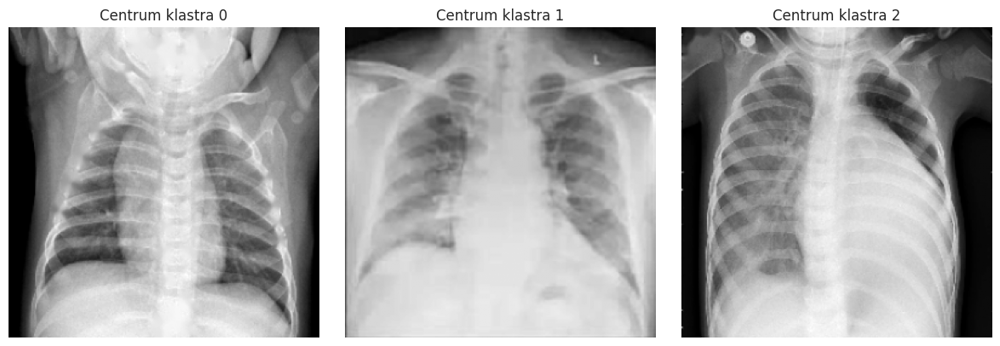

In [42]:
from sklearn.metrics import pairwise_distances_argmin_min
import matplotlib.pyplot as plt
import numpy as np

def show_representative_images(umap_data, kmeans_model, original_images):

    centers = kmeans_model.cluster_centers_
    closest_indices, _ = pairwise_distances_argmin_min(centers, umap_data)

    fig, axes = plt.subplots(1, len(closest_indices), figsize=(4 * len(closest_indices), 4))
    if len(closest_indices) == 1:
        axes = [axes]
    for i, idx in enumerate(closest_indices):
        ax = axes[i]
        ax.imshow(original_images[idx], cmap='gray')
        ax.set_title(f"Centrum klastra {i}")
        ax.axis('off')
    plt.tight_layout()
    plt.show()


def load_images_from_filenames(filenames_val, base_path="split_data/val"):

    images = []
    for filename in filenames_val:
        img_path = None
        for class_dir in Path(base_path).iterdir():
            if class_dir.is_dir():
                potential_path = class_dir / filename
                if potential_path.exists():
                    img_path = potential_path
                    break

        if img_path:
            img = plt.imread(img_path)
            images.append(img)
        else:
            print(f"Nie znaleziono obrazu: {filename}")
            images.append(np.zeros((64, 64)))

    return np.array(images)


X_images = load_images_from_filenames(filenames_val)


show_representative_images(umap_10d, kmeans, X_images)